# Cluster cells by secreted proteins (human protein atlas annotataion)

In [1]:
# load annotation and packages needed
from scSecretome.sc import *
from scSecretome.annot import *
import scanpy as sc

scanpy==1.4.3 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.2.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 


In [2]:
from scSecretome.secrete import *

## read processed single cell data
two sets:
1. `concat_one` is CD34+ cells from Pellin et.al
2. `concat_two` is Lin- cells from Pellin et. al

In [3]:
# read processed, filtered, normalized single cell data.
concat_one = sc.read('/home/hsher/processed_single_cell_data/pellin_cd34.h5ad')
concat_two = sc.read('/home/hsher/processed_single_cell_data/pellin_lin.h5ad')

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


## read Human protein atlas annotation
two kinds: `secreted protein` and `membrane protein`

In [4]:
secreted_protein = read_HPA('protein_class_Predicted_secrete.tsv', return_all = True)
membrane_protein = read_HPA('protein_class_Predicted_membrane.tsv', return_all = True)

In [5]:
# take a look at what's inside
secreted_protein.head()

,Gene description,RNA cell line specificity,RNA blood lineage specificity score
Gene,,,
A1BG,Alpha-1-B glycoprotein,Cell line enhanced,NaN
A2M,Alpha-2-macroglobulin,Group enriched,7.0
A2ML1,Alpha-2-macroglobulin like 1,Cell line enhanced,NaN
AADACL2,Arylacetamide deacetylase like 2,Cell line enriched,NaN
ABHD15,Abhydrolase domain containing 15,Low cell line specificity,NaN


## functions
`merge_subset` gives us variable secreted/membrane protein.

`vis_subset` helps us see the variable secreted/membrane protein by lineage inferred from **WHOLE** RNA.

` recluster` shows what will happed if we cluster cells by **only the variable SECRETED/MEMRBANE** protein.

In [6]:
def vis_subset(sc_data, top):
    
    # plotting on original clustering by ALL RNA species
    sc.pl.umap(sc_data, color = ['cluster', 'louvain'] + top)
    
    sc.pl.heatmap(concat_one, var_names = top, groupby = 'batch')
    
    sc.pl.heatmap(concat_one, var_names = top, groupby = 'louvain')

## First set
1. single cell = CD34
2. **secreted** protein

In [7]:
top = merge_subset(concat_one, secreted_protein, 'secreted_protein')

index
DEFA4                               Defensin alpha 4
ELANE                 Elastase, neutrophil expressed
LYZ                                         Lysozyme
PF4                                Platelet factor 4
AZU1                                    Azurocidin 1
PRTN3                                   Proteinase 3
PRSS2                              Serine protease 2
CCL2                    C-C motif chemokine ligand 2
CCL4                    C-C motif chemokine ligand 4
RNASE2                Ribonuclease A family member 2
JCHAIN       Joining chain of multimeric IgA and IgM
SMOC1        SPARC related modular calcium binding 1
C22orf46         Chromosome 22 open reading frame 46
NPTX2                           Neuronal pentraxin 2
INSL3                                 Insulin like 3
IGLL1       Immunoglobulin lambda like polypeptide 1
CXCL8                 C-X-C motif chemokine ligand 8
CST7                                      Cystatin F
LGALS1                                  

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


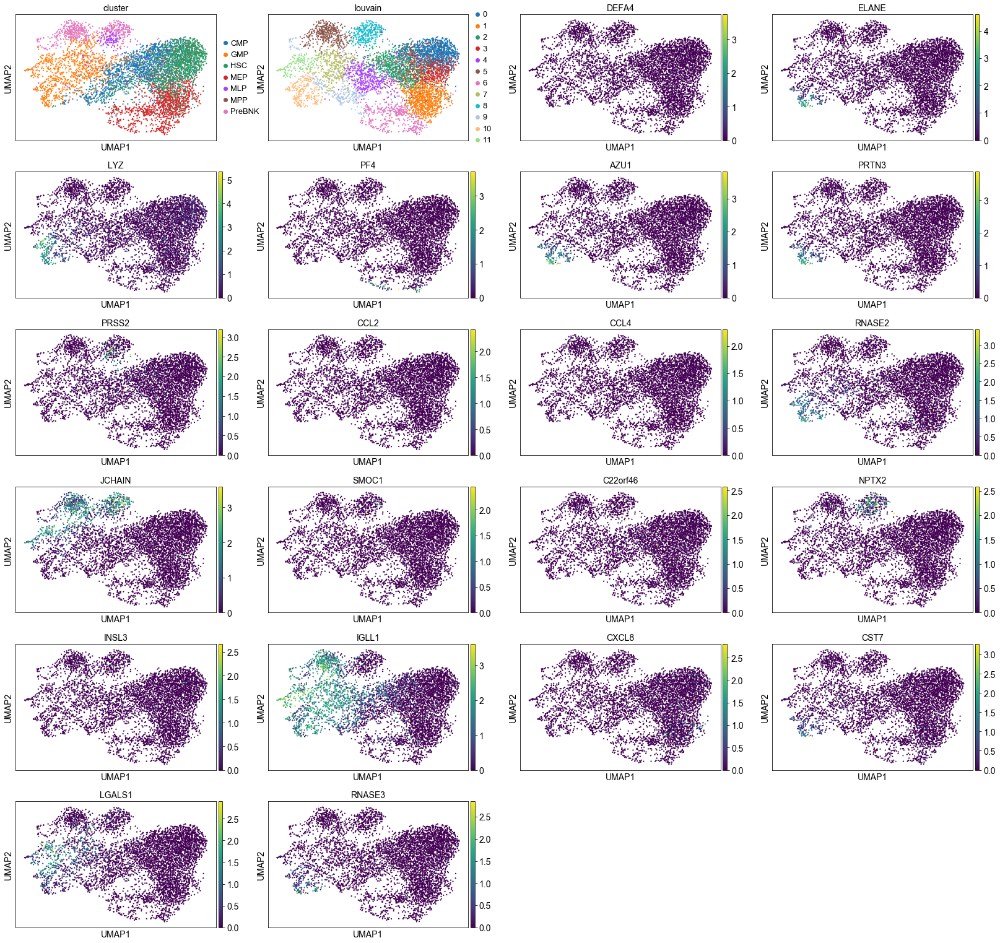

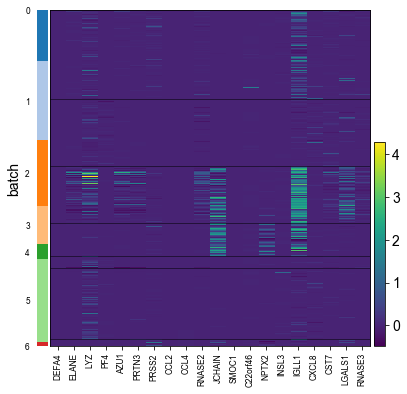

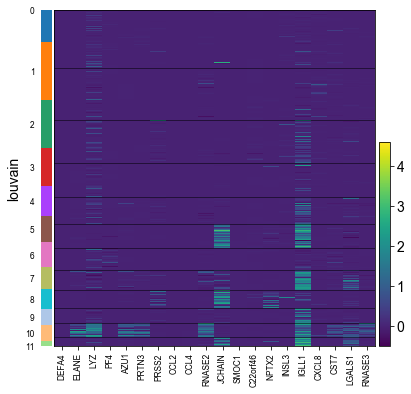

In [8]:
vis_subset(concat_one, top)

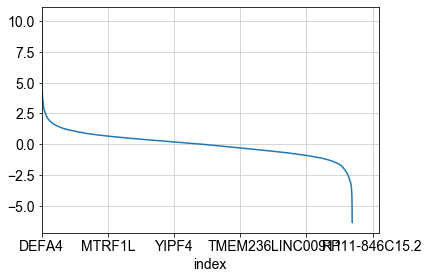

In [9]:
# determine cutoff of highly different secreted protein as clustering basis
concat_one.var['dispersions_norm'].sort_values(ascending = False).plot()
# about z score 1.5

computing PCA with n_comps = 50
    finished (0:00:00.03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:03.07) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:15.26) --> added
    'X_umap', UMAP coordinates (adata.obsm)


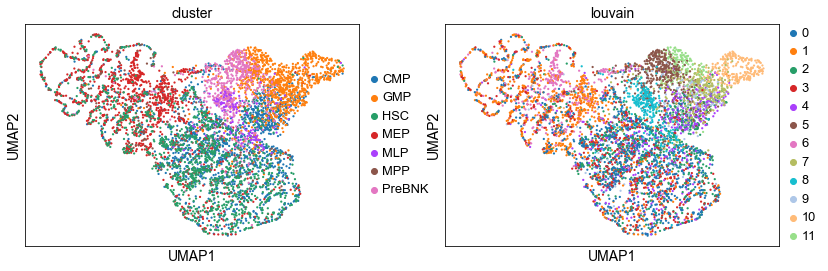

drawing single-cell graph using layout "fa"
    finished (0:00:32.84) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


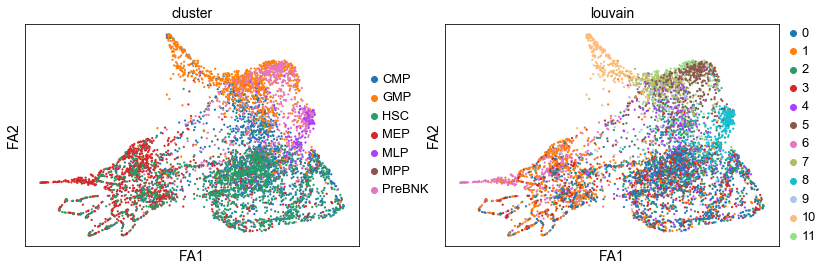

running PAGA


/home/hsher/miniconda3/lib/python3.7/site-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):


    finished (0:00:00.36) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


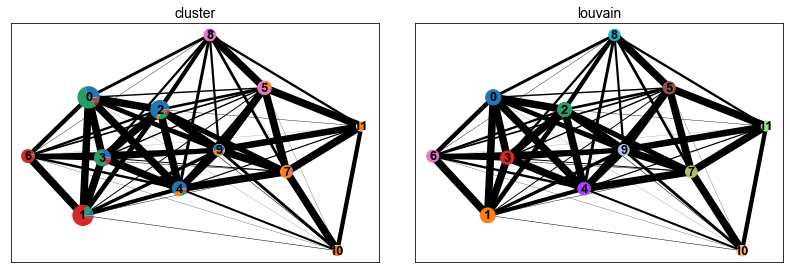

In [10]:
s = recluster(concat_one, 1.5, 'secreted_protein')

## Second set
1. single cell = CD34
2. membrane protein

Gene
KLRB1                   Killer cell lectin like receptor B1
PSKH1                              Protein serine kinase H1
LPAR1                      Lysophosphatidic acid receptor 1
PANX1                                            Pannexin 1
FXYD2      FXYD domain containing ion transport regulator 2
TENM4                      Teneurin transmembrane protein 4
CMTM4     CKLF like MARVEL transmembrane domain containi...
FCER1A                       Fc fragment of IgE receptor Ia
MS4A2                        Membrane spanning 4-domains A2
CACNG6    Calcium voltage-gated channel auxiliary subuni...
FAT3                                FAT atypical cadherin 3
RYR1                                   Ryanodine receptor 1
MUC12                     Mucin 12, cell surface associated
TRIB2                               Tribbles pseudokinase 2
OR4K13    Olfactory receptor family 4 subfamily K member 13
KCNK6     Potassium two pore domain channel subfamily K ...
MS4A14                      Membran

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


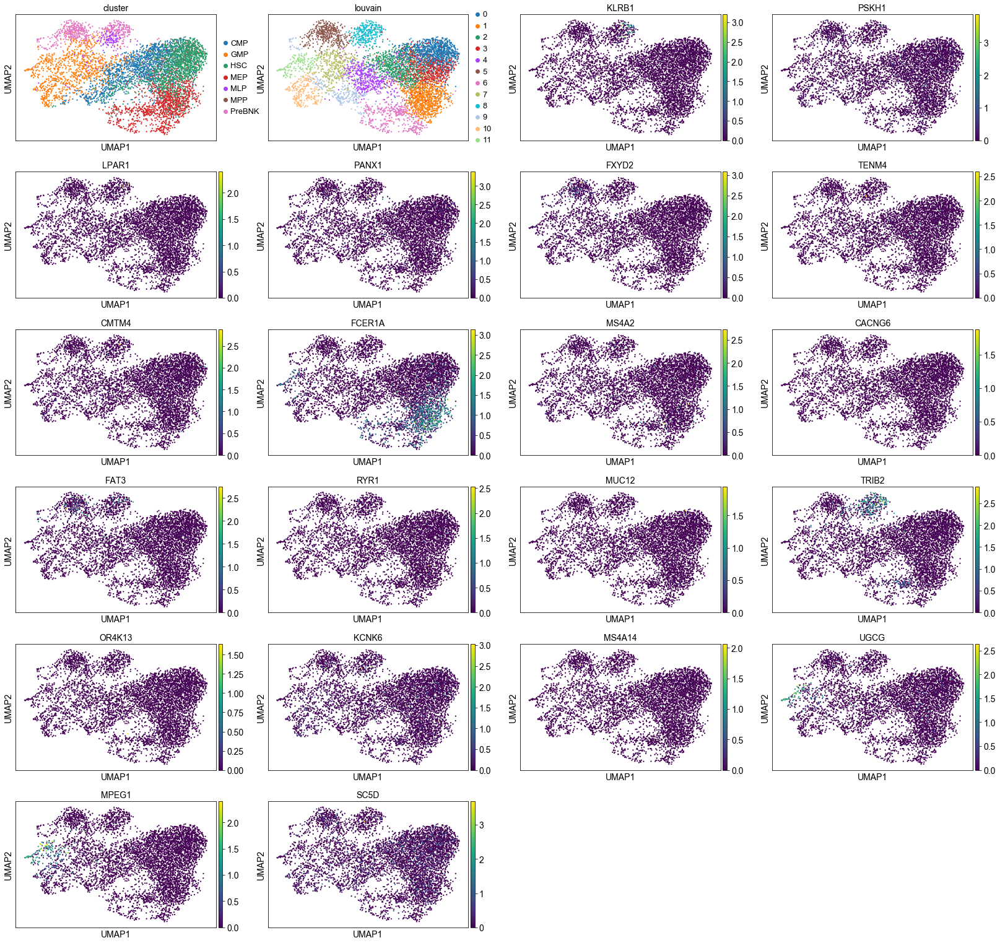

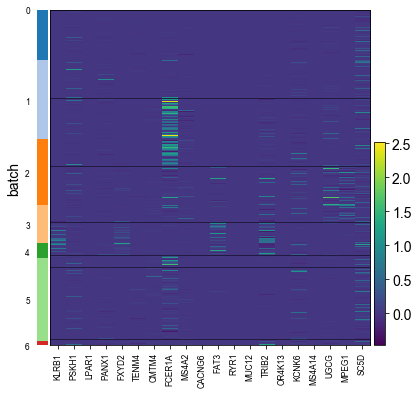

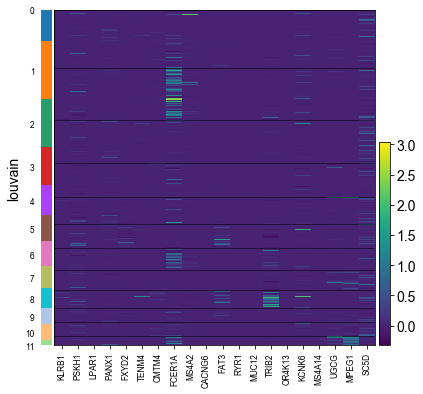

In [12]:
top = merge_subset(concat_one, membrane_protein, 'membrane_protein')
vis_subset(concat_one, top)

computing PCA with n_comps = 50
    finished (0:00:00.11)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:01.20) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:16.09) --> added
    'X_umap', UMAP coordinates (adata.obsm)


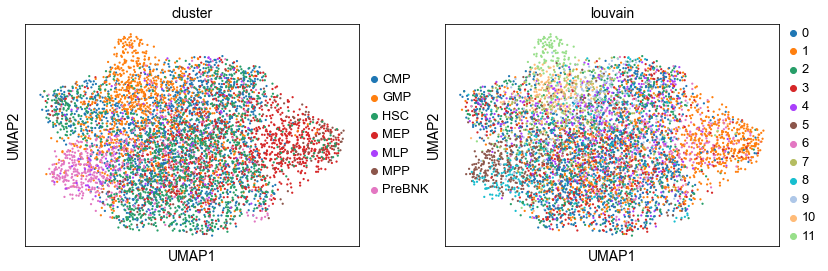

drawing single-cell graph using layout "fa"
    finished (0:00:36.84) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


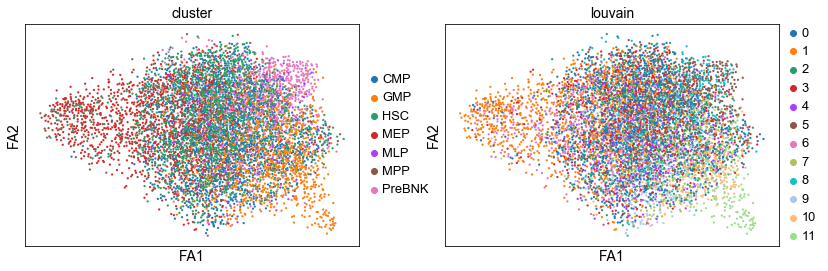

running PAGA


/home/hsher/miniconda3/lib/python3.7/site-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):


    finished (0:00:00.31) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


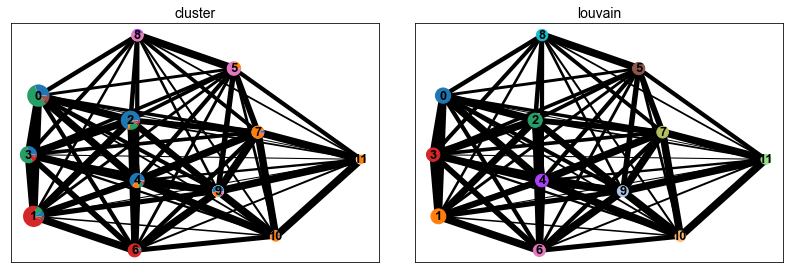

AnnData object with n_obs × n_vars = 6011 × 270 
    obs: 'cluster', 'louvain'
    uns: 'pca', 'neighbors', 'cluster_colors', 'louvain_colors', 'draw_graph', 'paga', 'louvain_sizes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'

In [13]:
recluster(concat_one, 1.5, 'membrane_protein')

## Third set
1. single cell = Lin cells
2. secreted_protein

index
TCN1                                  Transcobalamin 1
TPSAB1                           Tryptase alpha/beta 1
CPA3                               Carboxypeptidase A3
S100A8                 S100 calcium binding protein A8
CXCL8                   C-X-C motif chemokine ligand 8
PF4                                  Platelet factor 4
OLFM4                                   Olfactomedin 4
DEFB1                                  Defensin beta 1
PPBP                        Pro-platelet basic protein
LTF                                   Lactotransferrin
BPI       Bactericidal/permeability-increasing protein
DEFA4                                 Defensin alpha 4
S100A9                 S100 calcium binding protein A9
RNASE3                  Ribonuclease A family member 3
JCHAIN         Joining chain of multimeric IgA and IgM
CST3                                        Cystatin C
LUM                                            Lumican
ANXA2                                       Annexin A2
LGAL

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


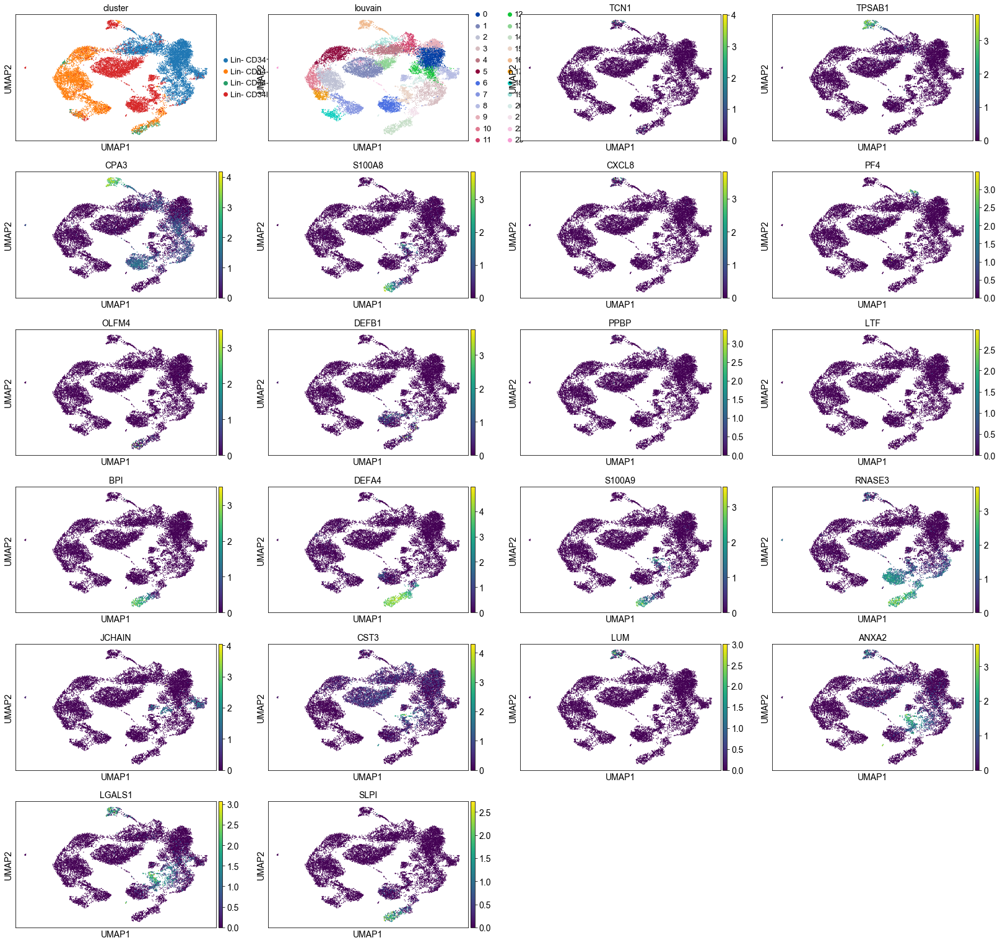

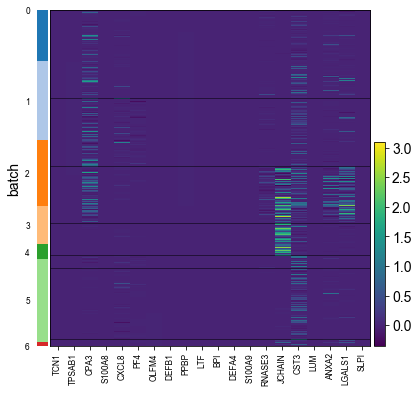

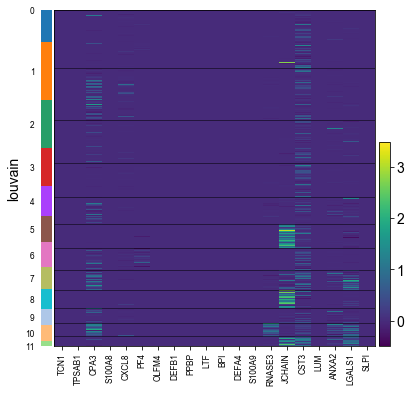

In [14]:
top= merge_subset(concat_two, secreted_protein, 'secreted_protein')
vis_subset(concat_two, top)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


computing PCA with n_comps = 50
    finished (0:00:00.05)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/hsher/miniconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../miniconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/hsher/miniconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../miniconda3/lib/python3.7/site-packages/umap/utils.py", line 409:
@num

    finished (0:00:07.40) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:17.47) --> added
    'X_umap', UMAP coordinates (adata.obsm)


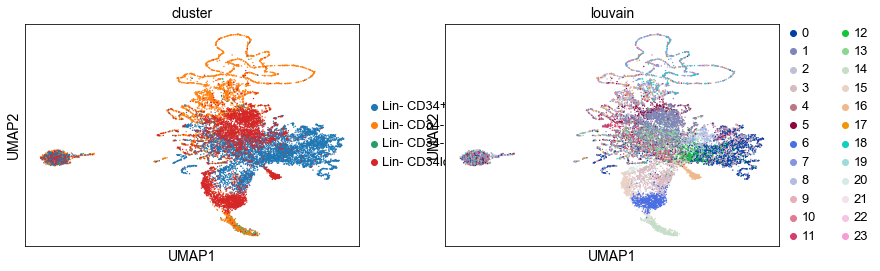

drawing single-cell graph using layout "fa"
    finished (0:01:52.38) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


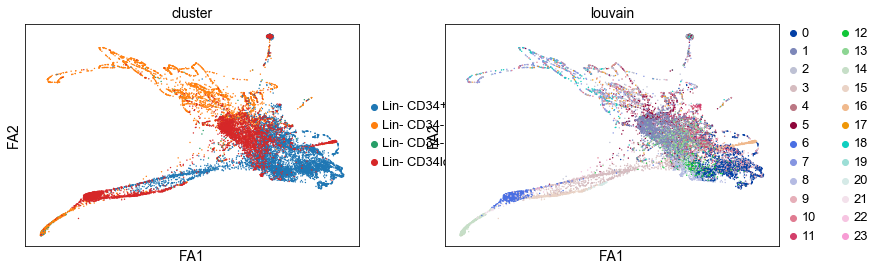

running PAGA


/home/hsher/miniconda3/lib/python3.7/site-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):


    finished (0:00:01.22) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


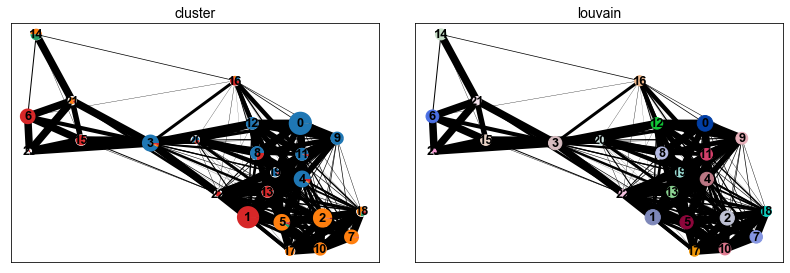

AnnData object with n_obs × n_vars = 15386 × 103 
    obs: 'cluster', 'louvain'
    uns: 'pca', 'neighbors', 'cluster_colors', 'louvain_colors', 'draw_graph', 'paga', 'louvain_sizes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'

In [16]:
recluster(concat_two, 1.5, 'secreted_protein')

## Fourth set
1. single cell = Lin cells
2. membrane_protein

Gene
MS4A2                         Membrane spanning 4-domains A2
TMCC2          Transmembrane and coiled-coil domain family 2
FCER1A                        Fc fragment of IgE receptor Ia
ALOX5AP       Arachidonate 5-lipoxygenase activating protein
XPO7                                              Exportin 7
CXCR4                       C-X-C motif chemokine receptor 4
S100A10                     S100 calcium binding protein A10
CEACAM6    Carcinoembryonic antigen related cell adhesion...
XCR1                          X-C motif chemokine receptor 1
SLC45A3                    Solute carrier family 45 member 3
CLEC10A                  C-type lectin domain containing 10A
CD79A                                         CD79a molecule
CXCR5                       C-X-C motif chemokine receptor 5
GPR68                          G protein-coupled receptor 68
CD9                                             CD9 molecule
CSF2RB     Colony stimulating factor 2 receptor beta comm...
SLC2A1             

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


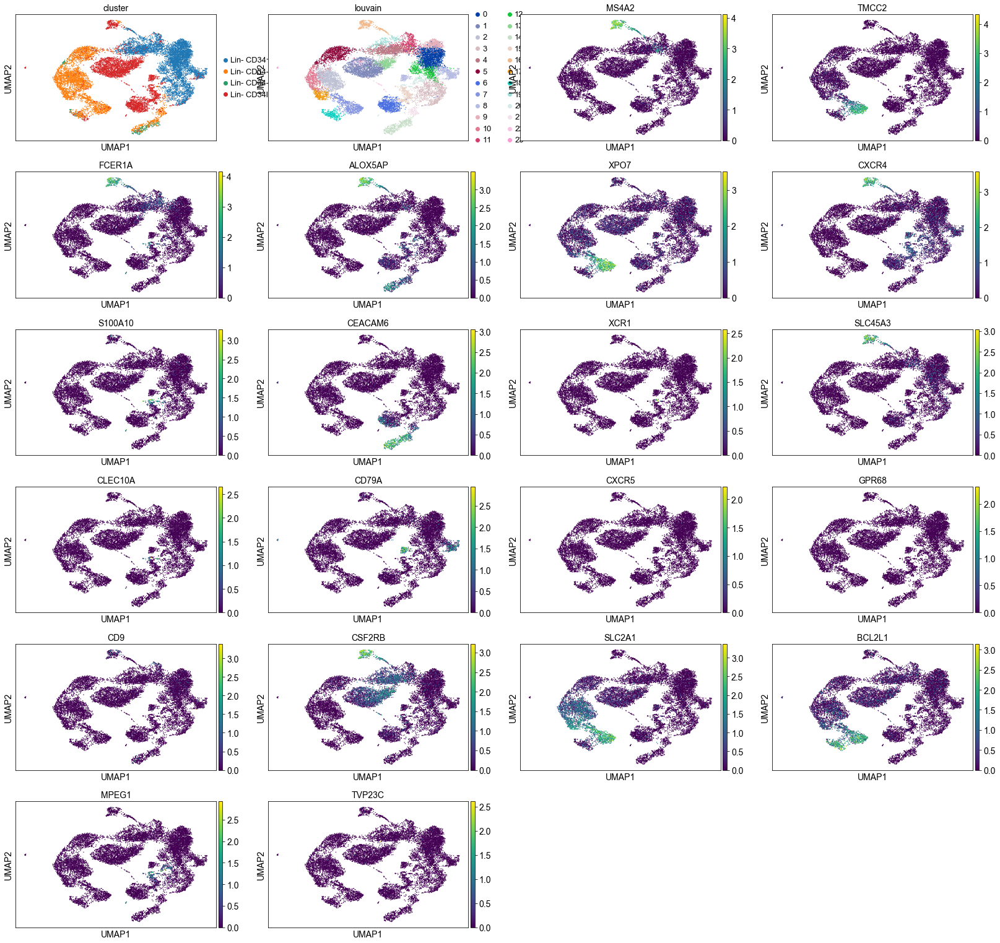

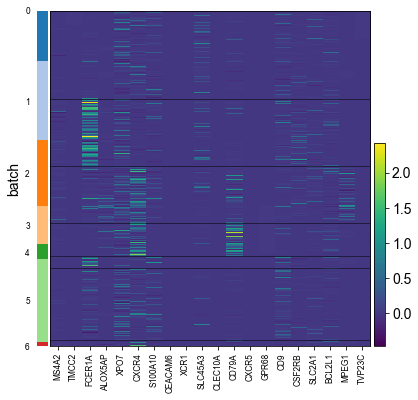

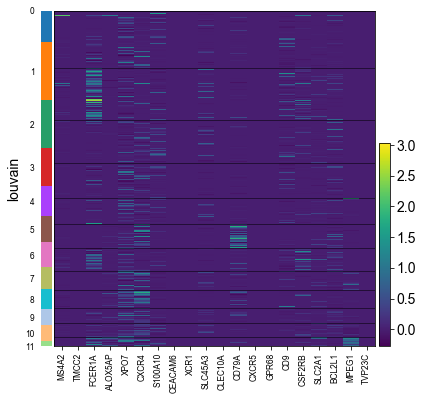

In [17]:
top = merge_subset(concat_two, membrane_protein, 'membrane_protein')
vis_subset(concat_two, top)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


computing PCA with n_comps = 50
    finished (0:00:00.08)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/hsher/miniconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../miniconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


    finished (0:00:04.93) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:16.14) --> added
    'X_umap', UMAP coordinates (adata.obsm)


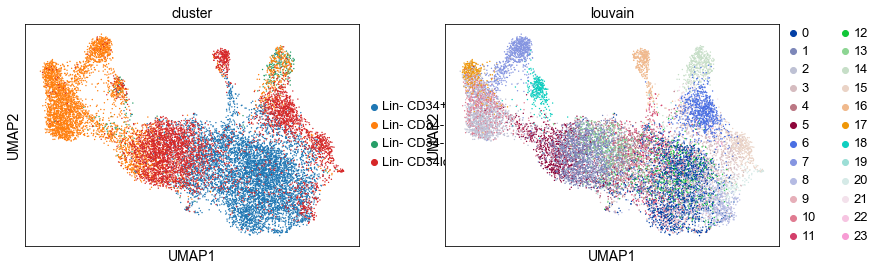

drawing single-cell graph using layout "fa"
    finished (0:01:53.73) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


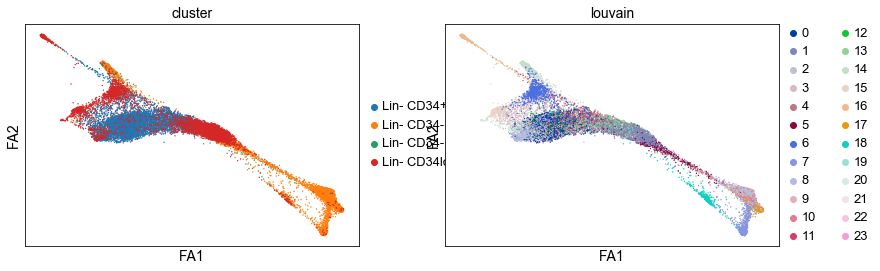

running PAGA


/home/hsher/miniconda3/lib/python3.7/site-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):


    finished (0:00:01.28) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


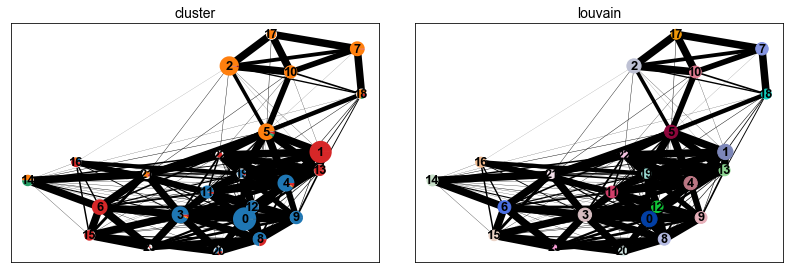

AnnData object with n_obs × n_vars = 15386 × 187 
    obs: 'cluster', 'louvain'
    uns: 'pca', 'neighbors', 'cluster_colors', 'louvain_colors', 'draw_graph', 'paga', 'louvain_sizes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'

In [18]:
recluster(concat_two, 1.5, 'membrane_protein')

# Extract secreted + membrane subset --> `cell2cell`
1. OR relationship in sc_data.var
2. extract subset

In [19]:
concat_one

AnnData object with n_obs × n_vars = 6011 × 25464 
    obs: 'Library', 'batch', 'cluster', 'n_counts', 'n_genes', 'percent_housekeeper', 'percent_mito', 'B Cell Lineage', 'Basophil Lineage', 'Dendritic Cell Lineage', 'Eosinophil Lineage', 'Erythrocyte Lineage', 'Macrophage Lineage', 'Megakaryocyte Lineage', 'Multi Potential Progenitor', 'NK Cell Lineage', 'Neutrophil Lineage', 'T Cell Lineage', 'C', 'O1', 'O2', 'O3', 'P1', 'P2', 'P3', 'P4', 'V1', 'V2', 'louvain', 'dpt_groups', 'dpt_order', 'dpt_order_indices'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'secreted_protein', 'membrane_protein'
    uns: 'cluster_colors', 'diffmap_evals', 'dpt_changepoints', 'dpt_grouptips', 'draw_graph', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_umap'
    varm: 'PCs'

In [20]:
def extract_secretome_subset(sc_data, ):
    subset = sc_data.var.loc[(sc_data.var['membrane_protein']) | (sc_data.var['secreted_protein'])].index
    return(sc_data[:, subset])

In [21]:
d = extract_secretome_subset(concat_one)

In [25]:
d.write('/home/hsher/processed_single_cell_data/pellin_cd34_sec.h5ad')

In [27]:
d = extract_secretome_subset(concat_two)

In [29]:
d.write('/home/hsher/processed_single_cell_data/pellin_lin_sec.h5ad')

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
